# Melt Season Figure

In [1]:
#!pip install matplotlib-scalebar

In [2]:
import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio as rio
import pystac
import pystac_client
import stackstac
import matplotlib.pyplot as plt
import xarray as xr
from datetime import datetime
import matplotlib
import ipyleaflet
import sys
import os
import dask_gateway
import dask
import planetary_computer
from rechunker import rechunk
sys.path.append('../sar_snowmelt_timing')
import s1_rtc_bs_utils
import contextily as ctx
import rioxarray as rxr
import skimage
import glob
from matplotlib_scalebar.scalebar import ScaleBar
import matplotlib.transforms as mtransforms

In [3]:
fontsize=19

font = {'family' : 'DejaVu Sans',
        'weight' : 'normal',
        'size'   : fontsize}

matplotlib.rc('font', **font)

In [4]:
cluster = dask_gateway.GatewayCluster(shutdown_on_close=False)
client = cluster.get_client()
cluster.adapt(minimum=100, maximum=400)
print(client.dashboard_link)

https://pccompute.westeurope.cloudapp.azure.com/compute/services/dask-gateway/clusters/prod.1118ee1f144d4be58008c0896836b044/status


In [5]:
# which location and melt season year to feature?
year = 2021
name = 'Mt. Rainier'
directory_name = 'MtRainier'

bbox_gdf = gpd.read_file('../input/shapefiles/mt_rainier.geojson')

In [6]:
start_clip = f'{year}-01-01'
end_clip = f'{year}-08-01'

In [7]:
ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac_pc(bbox_gdf,start_time='2015-01-01',end_time=datetime.today().strftime('%Y-%m-%d'),polarization='all')
ts_ds_clipped = s1_rtc_bs_utils.get_s1_rtc_stac_pc(bbox_gdf,start_time=start_clip,end_time=end_clip,polarization='all') 

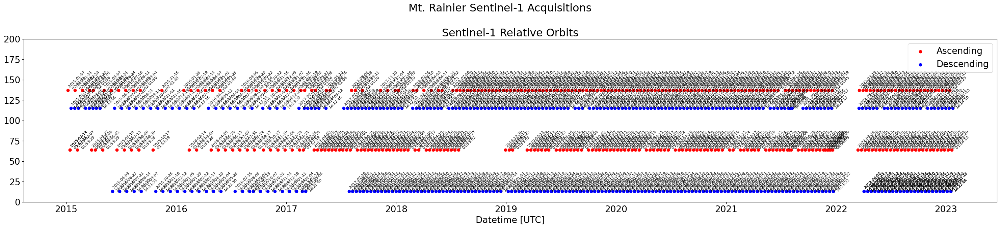

In [8]:
f,ax=plt.subplots(figsize=(30,7))
    
s1_rtc_bs_utils.plot_sentinel1_acquisitons(ts_ds,ax=ax)
f.suptitle(f'{name} Sentinel-1 Acquisitions')
plt.tight_layout()

In [9]:
classes = [ # page 13 of https://esa-worldcover.s3.amazonaws.com/v100/2020/docs/WorldCover_PUM_V1.0.pdf
#    10, # treecover
    20, # shrubland
    30, # grassland
    40, # cropland
#    50, # built-up
    60, #bare / sparse vegetation
    70, # snow and ice
#    80, # permanent water bodies
    90, # herbaceous wetlands
    95, # mangroves
    100 # loss and lichen
]

#display mask
#f,ax=plt.subplots(figsize=(8,8))
#worldcover.where(worldcover.isin(classes)).plot()

In [10]:
worldcover_ds = s1_rtc_bs_utils.get_worldcover(ts_ds)

In [11]:
ts_ds = ts_ds.where(worldcover_ds.isin(classes))
ts_ds_clipped = ts_ds_clipped.where(worldcover_ds.isin(classes))

In [12]:
filename_dem = glob.glob(f'../output/cascades/{directory_name}/*dem*.tif')
dem =  rxr.open_rasterio(filename_dem[0]).squeeze().where(worldcover_ds.isin(classes)).compute()

In [13]:
ts_ds = ts_ds.astype(np.float16)
ts_ds_clipped = ts_ds_clipped.astype(np.float16)

CPU times: user 1min 44s, sys: 30.5 s, total: 2min 14s
Wall time: 2min 56s


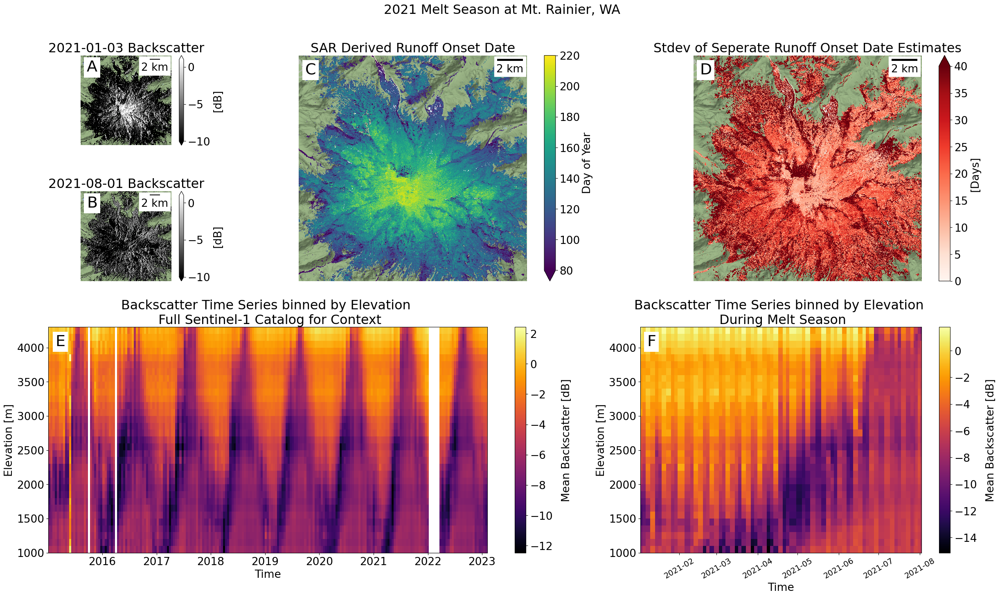

In [14]:
%%time
f,ax=plt.subplot_mosaic("ACCDD;BCCDD;EEEFF;EEEFF",figsize=(25,15))

#s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(ts_ds,dem,bin_size=100,ax=ax['D'],normalize_bins=True) #normalize=False
s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(ts_ds.sel(band='vv').resample(time='2W').mean(dim='time').compute(),dem,bin_size=100,ax=ax['E'],normalize_bins=False) #normalize=False
ax['E'].set_title(f"Backscatter Time Series binned by Elevation \n Full Sentinel-1 Catalog for Context")
    
ax['E'].set_xlabel('Time')
ax['E'].set_ylabel('Elevation [m]')
    
ax['F'].set_xlabel('Time')
ax['F'].set_ylabel('Elevation [m]')
    
aq_dates = list(pd.to_datetime(ts_ds_clipped.time.values).strftime('%Y-%m-%d'))
    
s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(ts_ds_clipped.sel(band='vv').compute(),dem,bin_size=100,ax=ax['F'],normalize_bins=False) #normalize=False
ax['F'].set_title(f"Backscatter Time Series binned by Elevation \n During {year} Melt Season")
    
(10*np.log10(ts_ds_clipped.sel(band='vv').isel(time=0))).plot(ax=ax['A'],vmin=-10,vmax=1,cmap='gray',cbar_kwargs={'label': '[dB]'})
(10*np.log10(ts_ds_clipped.sel(band='vv').isel(time=-1))).plot(ax=ax['B'],vmin=-10,vmax=1,cmap='gray',cbar_kwargs={'label': '[dB]'})
ctx.add_basemap(ax=ax['A'], crs=ts_ds_clipped.rio.crs, source=ctx.providers.Stamen.Terrain,attribution=False)
ctx.add_basemap(ax=ax['B'], crs=ts_ds_clipped.rio.crs, source=ctx.providers.Stamen.Terrain,attribution=False)

    
time1 = pd.to_datetime(ts_ds_clipped.isel(time=0).time.values).strftime('%Y-%m-%d')
time2 = pd.to_datetime(ts_ds_clipped.isel(time=-1).time.values).strftime('%Y-%m-%d')
     
ax['A'].set_title(f'{time1} Backscatter')
ax['B'].set_title(f'{time2} Backscatter')
    
ax['A'].axis('off')
ax['A'].add_artist(ScaleBar(1.0))
ax['A'].set_aspect('equal')
ax['B'].axis('off')
ax['B'].add_artist(ScaleBar(1.0))
ax['B'].set_aspect('equal')
ax['C'].axis('off')
ax['C'].add_artist(ScaleBar(1.0))
ax['C'].set_aspect('equal')
ax['D'].axis('off')
ax['D'].add_artist(ScaleBar(1.0))
ax['D'].set_aspect('equal')

    #ax['D'].tick_params(axis='both', which='major')
ax['F'].tick_params(axis='x', which='major', labelsize=fontsize-5)

    #ax['E'].set_xticks(aq_dates)
    
    #ax['E'].xaxis.set_minor_locator(FixedLocator(aq_dates))
    #ax['E'].tick_params(axis='x', colors='green')
    
########for date in aq_dates:
########    ax['F'].axvline(x=date, ymax=0.025, linewidth=3, color='green')
    
##########ax['F'].set_xlim([start_clip,end_clip])
    #[t.set_color('green') for t in ax['E'].xaxis.get_ticklines()]
    #ax['E'].set_xticklabels(ax['E'].get_xticks(), rotation = 30)
[t.set_rotation(30) for t in ax['F'].get_xticklabels()]
    
    #ts_ds.isel(time=0).plot(ax=ax[0],vmax=1.0,cmap='gray',add_colorbar=False)
s1_rtc_bs_utils.get_runoff_onset(ts_ds_clipped).dt.dayofyear.plot(ax=ax['C'],cmap='viridis',vmin=80,vmax=220,cbar_kwargs={'label': 'Day of Year'})
ctx.add_basemap(ax=ax['C'], crs=ts_ds.rio.crs, source=ctx.providers.Stamen.Terrain,attribution=False)
ax['C'].set_title(f'SAR Derived Runoff Onset Date')

s1_rtc_bs_utils.get_runoff_onset(ts_ds_clipped,return_seperate_orbits_and_polarizations=True).dt.dayofyear.std(dim=['sat:relative_orbit','band']).plot(ax=ax['D'],cmap='Reds',vmin=0,vmax=40,cbar_kwargs={'label': '[Days]'})
ctx.add_basemap(ax=ax['D'], crs=ts_ds.rio.crs, source=ctx.providers.Stamen.Terrain,attribution=False)
ax['D'].set_title(f'Stdev of Seperate Runoff Onset Date Estimates')

    
distance_cutoff=1
minx, miny, maxx, maxy = ts_ds.rio.bounds()
ax['C'].set_xlim([minx,maxx])
ax['C'].set_ylim([miny,maxy])

ax['D'].set_xlim([minx,maxx])
ax['D'].set_ylim([miny,maxy])
    
for label, axs in ax.items():
        # label physical distance in and down:
    trans = mtransforms.ScaledTranslation(10/72, -5/72, f.dpi_scale_trans)
    axs.text(0.003, 0.98, label, transform=axs.transAxes + trans,
    fontsize='x-large', verticalalignment='top', fontfamily='sans-serif',
    bbox=dict(facecolor='white', edgecolor='none', pad=5.0))
    
f.suptitle(f'{year} Melt Season at {name}, WA \n')
   
plt.tight_layout()
    
plt.savefig(f'../output/cascades/{directory_name}/{directory_name}_{year}_meltseason_figure.png',dpi=150)